In [4]:

%%capture


# pip install pafy youtube-dl moviepy

In [5]:

import os
import cv2
import pafy
import math
import random
import numpy as np
import datetime as dt
import tensorflow as tf
from collections import deque
import matplotlib.pyplot as plt

from moviepy.editor import *
%matplotlib inline

from sklearn.model_selection import train_test_split

from tensorflow.keras.layers import *
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model



In [6]:
seed_constant=27
np.random.seed(seed_constant)
random.seed(seed_constant)
tf.random.set_seed(seed_constant)

In [ ]:

# %%capture


# wget --no-check-certificate https://www.crcv.ucf.edu/data/UCF50.rar


# unrar x UCF50.rar

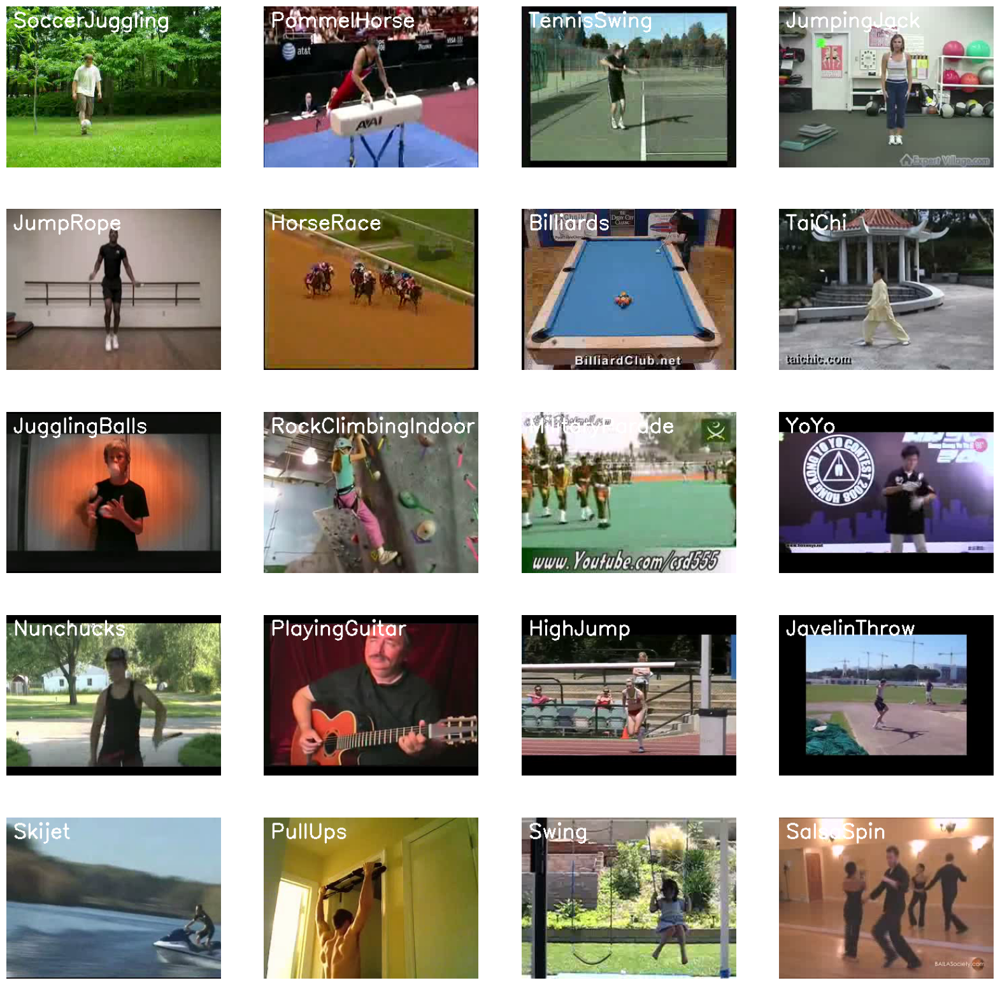

In [7]:

plt.figure(figsize=(20,20))


all_classes_names = os.listdir('UCF50')



random_range = random.sample(range(len(all_classes_names)),20)


for counter,random_index in enumerate(random_range,1):


  selected_class_Name = all_classes_names[random_index]


  video_files_names_list=os.listdir(f'UCF50/{selected_class_Name}')


  selected_video_file_name=random.choice(video_files_names_list)


  video_reader = cv2.VideoCapture(f'UCF50/{selected_class_Name}/{selected_video_file_name}')


  _, bgr_frame = video_reader.read()


  video_reader.release()


  rgb_frame = cv2.cvtColor(bgr_frame,cv2.COLOR_BGR2RGB)


  cv2.putText(rgb_frame, selected_class_Name,(10,30),cv2.FONT_HERSHEY_SIMPLEX,1,(255,255,255),2)

  plt.subplot(5,4,counter);plt.imshow(rgb_frame);plt.axis('off')



In [8]:
IMAGE_HEIGHT,IMAGE_WIDTH =64,64
import os


SEQUENCE_LENGTH = 20

DATASET_DIR="UCF50"

CLASSES_LIST=["WalkingWithDog", "TaiChi", "Swing", "HorseRace"]
# CLASSES_LIST = []
# for i in os.listdir((os.path.join(os.curdir,DATASET_DIR))):
#     CLASSES_LIST.append(i)
print(CLASSES_LIST)

['BaseballPitch', 'Basketball', 'BenchPress', 'Biking', 'Billiards', 'BreastStroke', 'CleanAndJerk', 'Diving', 'Drumming', 'Fencing', 'GolfSwing', 'HighJump', 'HorseRace', 'HorseRiding', 'HulaHoop', 'JavelinThrow', 'JugglingBalls', 'JumpingJack', 'JumpRope', 'Kayaking', 'Lunges', 'MilitaryParade', 'Mixing', 'Nunchucks', 'PizzaTossing', 'PlayingGuitar', 'PlayingPiano', 'PlayingTabla', 'PlayingViolin', 'PoleVault', 'PommelHorse', 'PullUps', 'Punch', 'PushUps', 'RockClimbingIndoor', 'RopeClimbing', 'Rowing', 'SalsaSpin', 'SkateBoarding', 'Skiing', 'Skijet', 'SoccerJuggling', 'Swing', 'TaiChi', 'TennisSwing', 'ThrowDiscus', 'TrampolineJumping', 'VolleyballSpiking', 'WalkingWithDog', 'YoYo']


In [9]:
def frames_extraction(video_path):

    frames_list = []


    video_reader = cv2.VideoCapture(video_path)


    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))


    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH),1)

    for frame_counter in range(SEQUENCE_LENGTH):



      video_reader.set(cv2.CAP_PROP_POS_FRAMES,frame_counter * skip_frames_window)


      success, frame = video_reader.read()


      if not success:
        break


      resized_frame=cv2.resize(frame,(IMAGE_HEIGHT,IMAGE_WIDTH))


      normalized_frame = resized_frame / 255


      frames_list.append(normalized_frame)
    video_reader.release()
    return frames_list




In [10]:
def create_dataset():


  features = []
  labels = []
  video_files_paths=[]


  for class_index,class_name in enumerate(CLASSES_LIST):


    print(f'extracting data of class: {class_name}')


    files_list = os.listdir(os.path.join(DATASET_DIR,class_name))


    for file_name in files_list :


      video_file_path = os.path.join(DATASET_DIR,class_name,file_name)


      frames = frames_extraction(video_file_path)



      if len(frames)==SEQUENCE_LENGTH:


        features.append(frames)
        labels.append(class_index)
        video_files_paths.append(video_file_path)


  features = np.asarray(features)
  labels= np.array(labels)


  return features,labels,video_files_paths

In [ ]:
features, labels, video_files_paths =  create_dataset()

In [8]:
one_hot_encoded_labels = to_categorical(labels)

In [9]:
features_train, features_test ,labels_train,labels_test = train_test_split(features, one_hot_encoded_labels,
                                                                           test_size= 0.25,shuffle = True,
                                                                           random_state = seed_constant)

In [10]:
def create_LRCN_model():

  model=Sequential()




  model.add(TimeDistributed(Conv2D(16 , (3,3),padding ='same' , activation= 'relu'),
                            input_shape = (SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))

  model.add(TimeDistributed(MaxPooling2D((4,4))))
  model.add(TimeDistributed(Dropout(0.25)))

  model.add(TimeDistributed(Conv2D(32 , (3,3),padding ='same' , activation= 'relu')))
  model.add(TimeDistributed(MaxPooling2D((4,4))))
  model.add(TimeDistributed(Dropout(0.25)))

  model.add(TimeDistributed(Conv2D(64 , (3,3),padding ='same' , activation= 'relu')))
  model.add(TimeDistributed(MaxPooling2D((2,2))))
  model.add(TimeDistributed(Dropout(0.25)))

  model.add(TimeDistributed(Conv2D(64 , (3,3),padding ='same' , activation= 'relu')))
  model.add(TimeDistributed(MaxPooling2D((2,2))))
  model.add(TimeDistributed(Dropout(0.25)))

  model.add(TimeDistributed(Flatten()))

  model.add(LSTM(32))

  model.add(Dense(len(CLASSES_LIST),activation= 'softmax'))




  model.summary()

  return model






In [11]:
LRCN_model = create_LRCN_model()
print("Model Created Successfully!")

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDistr  (None, 20, 64, 64, 16)   448       
 ibuted)                                                         
                                                                 
 time_distributed_1 (TimeDis  (None, 20, 16, 16, 16)   0         
 tributed)                                                       
                                                                 
 time_distributed_2 (TimeDis  (None, 20, 16, 16, 16)   0         
 tributed)                                                       
                                                                 
 time_distributed_3 (TimeDis  (None, 20, 16, 16, 32)   4640      
 tributed)                                                       
                                                                 
 time_distributed_4 (TimeDis  (None, 20, 4, 4, 32)     0

In [12]:
early_stopping_callback = EarlyStopping(monitor = 'val_loss',patience = 15, mode = 'min',restore_best_weights=True)

LRCN_model.compile(loss= 'categorical_crossentropy',optimizer='Adam',metrics = ["accuracy"])


with tf.device('/GPU:0'):
    LRCN_model_training_history = LRCN_model.fit(x= features_train,y= labels_train,epochs= 70,batch_size = 4,
                                             shuffle = True, validation_split = 0.2, callbacks =[early_stopping_callback])

Epoch 1/70
73/73 [==============================] - 18s 49ms/step - loss: 1.3899 - accuracy: 0.2568 - val_loss: 1.3593 - val_accuracy: 0.3562
Epoch 2/70
73/73 [==============================] - 2s 25ms/step - loss: 1.3655 - accuracy: 0.3151 - val_loss: 1.3293 - val_accuracy: 0.4932
Epoch 3/70
73/73 [==============================] - 2s 24ms/step - loss: 1.2935 - accuracy: 0.4247 - val_loss: 1.2360 - val_accuracy: 0.4247
Epoch 4/70
73/73 [==============================] - 2s 26ms/step - loss: 1.1501 - accuracy: 0.4966 - val_loss: 1.1552 - val_accuracy: 0.5342
Epoch 5/70
73/73 [==============================] - 2s 26ms/step - loss: 0.9466 - accuracy: 0.6370 - val_loss: 0.7811 - val_accuracy: 0.6712
Epoch 6/70
73/73 [==============================] - 2s 24ms/step - loss: 0.8492 - accuracy: 0.6473 - val_loss: 0.8799 - val_accuracy: 0.6575
Epoch 7/70
73/73 [==============================] - 2s 25ms/step - loss: 0.7420 - accuracy: 0.7123 - val_loss: 0.9313 - val_accuracy: 0.6301
Epoch 8/70
7

In [17]:
model_evaluation_history = LRCN_model.evaluate(features_test,labels_test)

4/4 [==============================] - 0s 48ms/step - loss: 0.2745 - accuracy: 0.9262


In [16]:
LRCN_model.save('LRCN.model')

INFO:tensorflow:Assets written to: LRCN.model\assets


INFO:tensorflow:Assets written to: LRCN.model\assets


In [19]:

model_evaluation_loss, model_evaluation_accuracy = model_evaluation_history




date_time_format= '%Y_%m_%d__%H_%H_%S'
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt,date_time_format)


model_file_name = f'LRCN_model__Date_Time_{current_date_time_string}__Loss_{model_evaluation_loss}__Accuracy_{model_evaluation_accuracy}.h5'


LRCN_model.save(model_file_name)

In [ ]:
def plot_metric(model_training_history,metric_name_1,metric_name_2,plot_name):


  metric_value_1=model_training_history.history[metric_name_1]
  metric_value_2=model_training_history.history[metric_name_2]


  epochs=range(len(metric_value_1))


  plt.plot(epochs,metric_value_1,'blue',label=metric_name_1)
  plt.plot(epochs,metric_value_2,'red',label=metric_name_2)


  plt.title(str(plot_name))


  plt.legend()


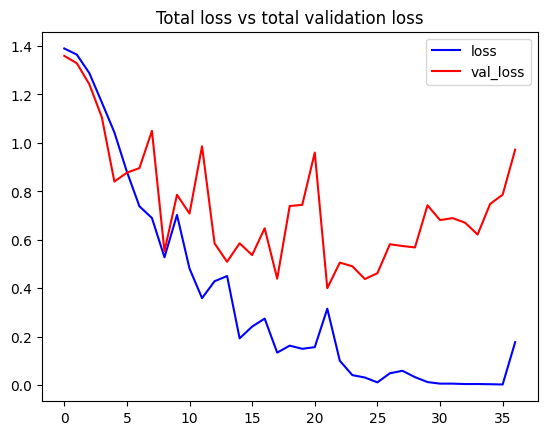

In [ ]:
plot_metric(LRCN_model_training_history,'loss','val_loss','Total loss vs total validation loss')

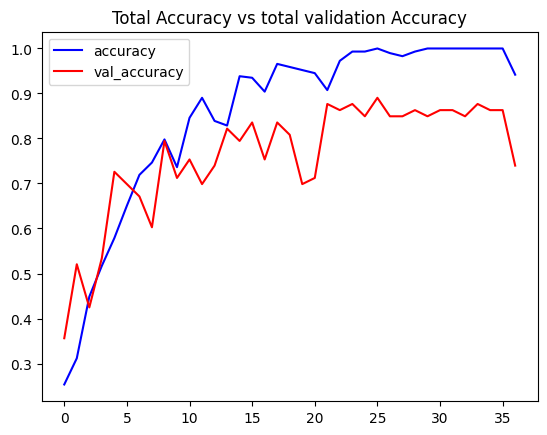

In [ ]:
plot_metric(LRCN_model_training_history,'accuracy','val_accuracy','Total Accuracy vs total validation Accuracy')

In [21]:
def download_youtube_videos(youtube_video_url, output_directory):
     '''
    This function downloads the youtube video whose URL is passed to it as an argument.
    Args:
        youtube_video_url: URL of the video that is required to be downloaded.
        output_directory:  The directory path to which the video needs to be stored after downloading.
    Returns:
        title: The title of the downloaded youtube video.
    '''
 
     # Create a video object which contains useful information about the video.
     video = pafy.new(youtube_video_url)
 
     # Retrieve the title of the video.
     title = video.title
 
     # Get the best available quality object for the video.
     video_best = video.getbest()
 
     # Construct the output file path.
     output_file_path = f'{output_directory}/{title}.mp4'
 
     # Download the youtube video at the best available quality and store it to the contructed path.
     video_best.download(filepath = output_file_path, quiet = True)
 
     # Return the video title.
     return title

In [23]:
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory,exist_ok = True)

# Download a YouTube Video.
video_title = "testsample"

# Get the YouTube Video's path we just downloaded.
input_video_file_path = f'{test_videos_directory}/{video_title}.mp4'


In [24]:
def predict_on_video(video_file_path,output_file_path,SEQUENCE_LENGTH):
  video_reader = cv2.VideoCapture(video_file_path)


  original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
  original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))


  video_writer = cv2.VideoWriter(output_file_path,cv2.VideoWriter_fourcc('M','P','4','V'),
                                 video_reader.get(cv2.CAP_PROP_FPS),(original_video_width,original_video_height))


  frames_queue = deque(maxlen = SEQUENCE_LENGTH)


  predicted_class_name =''


  while video_reader.isOpened():


    ok, frame = video_reader.read()


    if not ok:
      break


    resized_frame = cv2.resize(frame,(IMAGE_HEIGHT,IMAGE_WIDTH))


    normalized_frame = resized_frame / 255


    frames_queue.append(normalized_frame)


    if len(frames_queue) == SEQUENCE_LENGTH:


      predicted_labels_probabilites= LRCN_model.predict(np.expand_dims(frames_queue,axis=0))[0]


      predicted_label = np.argmax(predicted_labels_probabilites)


      predicted_class_name = CLASSES_LIST[predicted_label]

    cv2.putText(frame,predicted_class_name,(10,30),cv2.FONT_HERSHEY_SIMPLEX,1,(0,255,0),2)


    video_writer.write(frame)

  video_reader.release()
  video_writer.release()

In [25]:
output_video_file_path = f'{test_videos_directory}/{video_title}-Output-Seqlen{SEQUENCE_LENGTH}.mp4'

predict_on_video(input_video_file_path,output_video_file_path,SEQUENCE_LENGTH)

VideoFileClip(output_video_file_path,audio=False,target_resolution=(300,None)).ipython_display()

1/1 [==============================] - 0s 67ms/step
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



t:  97%|█████████▋| 838/867 [00:02<00:00, 390.57it/s, now=None]WARNING:py.warnings:c:\Users\hp\AppData\Local\Programs\Python\Python310\lib\site-packages\moviepy\video\io\ffmpeg_reader.py:123: UserWarning: Warning: in file test_videos/testsample-Output-Seqlen20.mp4, 360000 bytes wanted but 0 bytes read,at frame 866/867, at time 31.04/31.04 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [ ]:
def predict_single_action(video_file_path, SEQUENCE_LENGTH):
    '''
    This function will perform single action recognition prediction on a video using the LRCN model.
    Args:
    video_file_path:  The path of the video stored in the disk on which the action recognition is to be performed.
    SEQUENCE_LENGTH:  The fixed number of frames of a video that can be passed to the model as one sequence.
    '''

    # Initialize the VideoCapture object to read from the video file.
    video_reader = cv2.VideoCapture(video_file_path)

    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Declare a list to store video frames we will extract.
    frames_list = []

    # Initialize a variable to store the predicted action being performed in the video.
    predicted_class_name = ''

    # Get the number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH),1)

    # Iterating the number of times equal to the fixed length of sequence.
    for frame_counter in range(SEQUENCE_LENGTH):

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        # Read a frame.
        success, frame = video_reader.read()

        # Check if frame is not read properly then break the loop.
        if not success:
            break

        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1.
        normalized_frame = resized_frame / 255

        # Appending the pre-processed frame into the frames list
        frames_list.append(normalized_frame)

    # Passing the  pre-processed frames to the model and get the predicted probabilities.
    predicted_labels_probabilities = LRCN_model.predict(np.expand_dims(frames_list, axis = 0))[0]

    # Get the index of class with highest probability.
    predicted_label = np.argmax(predicted_labels_probabilities)

    # Get the class name using the retrieved index.
    predicted_class_name = CLASSES_LIST[predicted_label]

    # Display the predicted action along with the prediction confidence.
    print(f'Action Predicted: {predicted_class_name}\nConfidence: {predicted_labels_probabilities[predicted_label]}')

    # Release the VideoCapture object.
    video_reader.release()

In [ ]:
# Download the youtube video.

# Perform Single Prediction on the Test Video.
predict_single_action(input_video_file_path, SEQUENCE_LENGTH)

# Display the input video.
VideoFileClip(input_video_file_path, audio=False, target_resolution=(300,None)).ipython_display()

1/1 [==============================] - 0s 38ms/step
Action Predicted: WalkingWithDog
Confidence: 0.9962618947029114
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



t:  96%|█████████▋| 232/241 [00:00<00:00, 252.23it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file test_videos/olympicss.mp4, 360000 bytes wanted but 0 bytes read,at frame 240/241, at time 8.01/8.01 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+

                                                               

Moviepy - Done !
Moviepy - video ready __temp__.mp4


# New Section